<a href="https://colab.research.google.com/github/LuizWalker/PIM---Processamento-de-Imagens-Medicas/blob/main/PIM_Mestrado_Atividade_03.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Importando as bibliotecas e imagens

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

In [ ]:
path_garden_high_resolution = '/content/drive/MyDrive/PIM_imagens/Jardim_Simples_1280_853.jpg'
path_garden_low_resolution = '/content/drive/MyDrive/PIM_imagens/Jardim_Simples_640_427.jpg'

#Histograma das Imagens em tons de cinza

<StemContainer object of 3 artists>

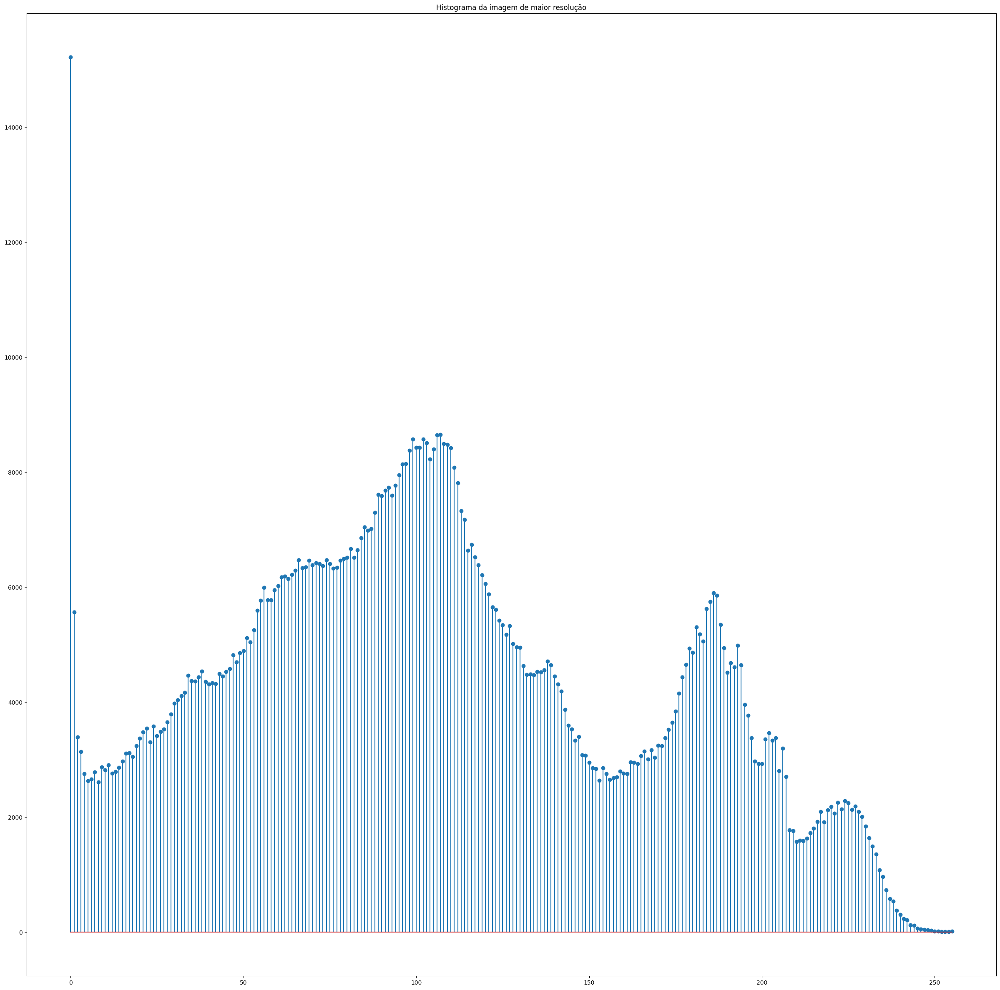

In [ ]:
gray_garden_high_resolution = cv2.imread(path_garden_high_resolution,0)
hist_garden_high_resolution = cv2.calcHist([gray_garden_high_resolution],[0], None, [256], [0, 256])
plt.figure(figsize=(30,30))
plt.title("Histograma da imagem de maior resolução")
plt.stem(hist_garden_high_resolution)


<StemContainer object of 3 artists>

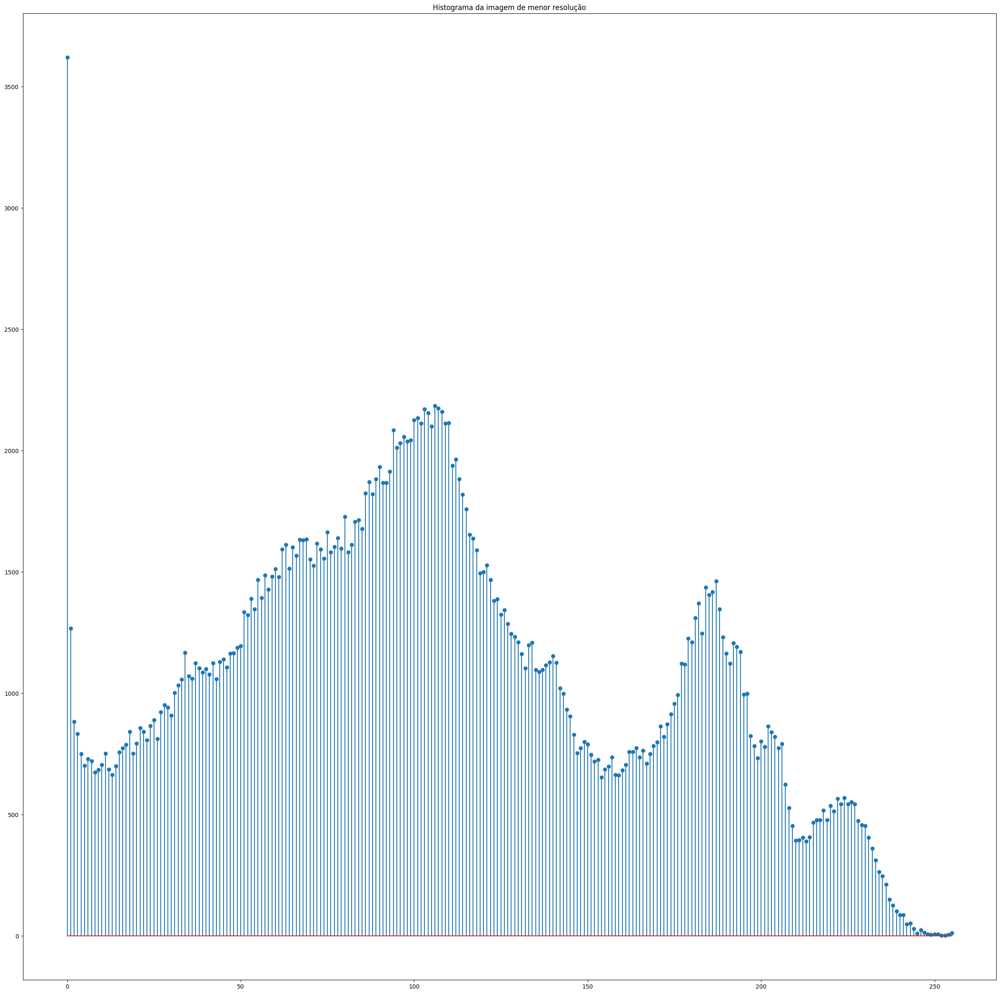

In [ ]:
gray_garden_low_resolution = cv2.imread(path_garden_low_resolution ,0)
hist_garden_low_resolution = cv2.calcHist([gray_garden_low_resolution],[0], None, [256], [0, 256])
plt.figure(figsize=(30,30))
plt.title("Histograma da imagem de menor resolução")
plt.stem(hist_garden_low_resolution )

#Aplicação da função gamma


In [ ]:
def gammacorrection(src, gamma):
    table = [((i / 255) ** gamma) * 255 for i in range(256)]
    table = np.array(table, np.uint8)

    return cv2.LUT(src, table)


##Clareamento da imagem de alta resolução

$Gamma = \frac{1}{2}$

<StemContainer object of 3 artists>

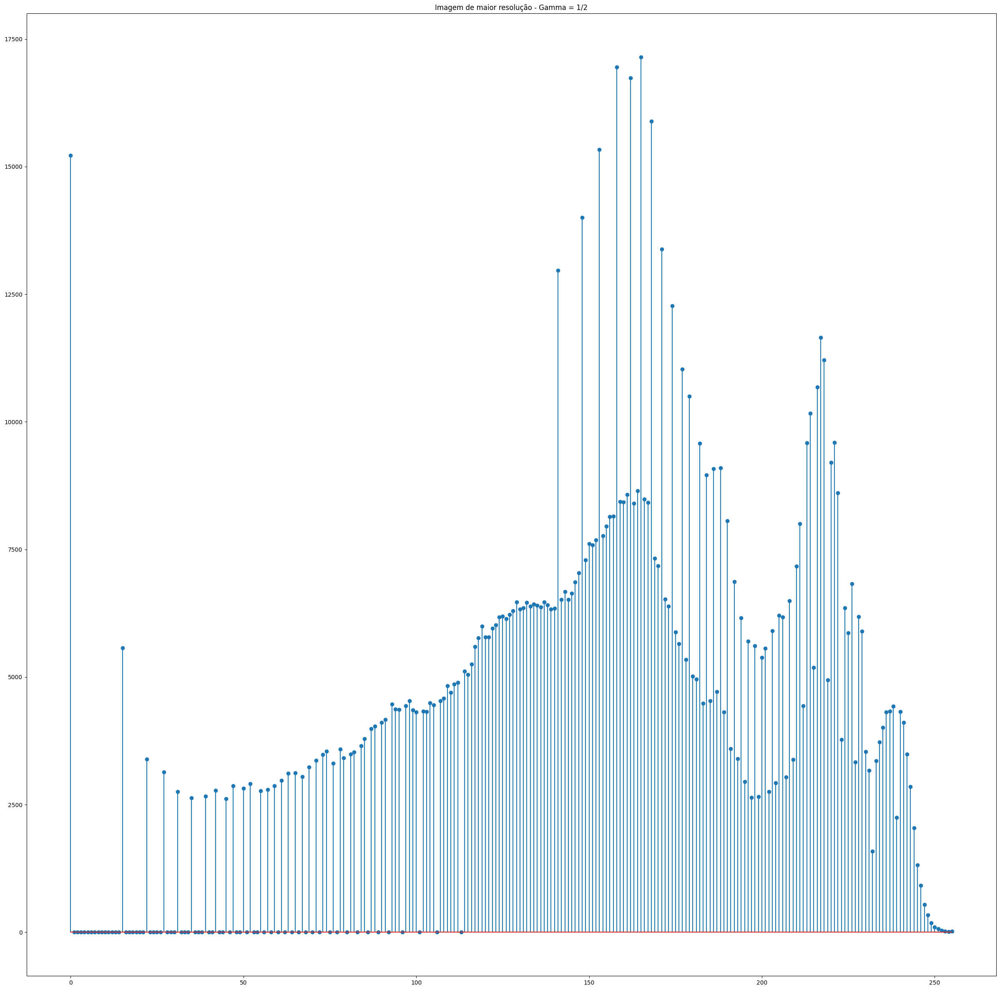

In [ ]:
first_gamma_correction_high_resolution = gammacorrection(gray_garden_high_resolution,(1/2))
#cv2_imshow(first_gamma_correction_high_resolution)
first_gamma_correction_histogram = cv2.calcHist([first_gamma_correction_high_resolution],[0], None, [256], [0, 256])
plt.figure(figsize=(30,30))
plt.title("Imagem de maior resolução - Gamma = 1/2")
plt.stem(first_gamma_correction_histogram)

$Gamma = \frac{1}{8}$

<StemContainer object of 3 artists>

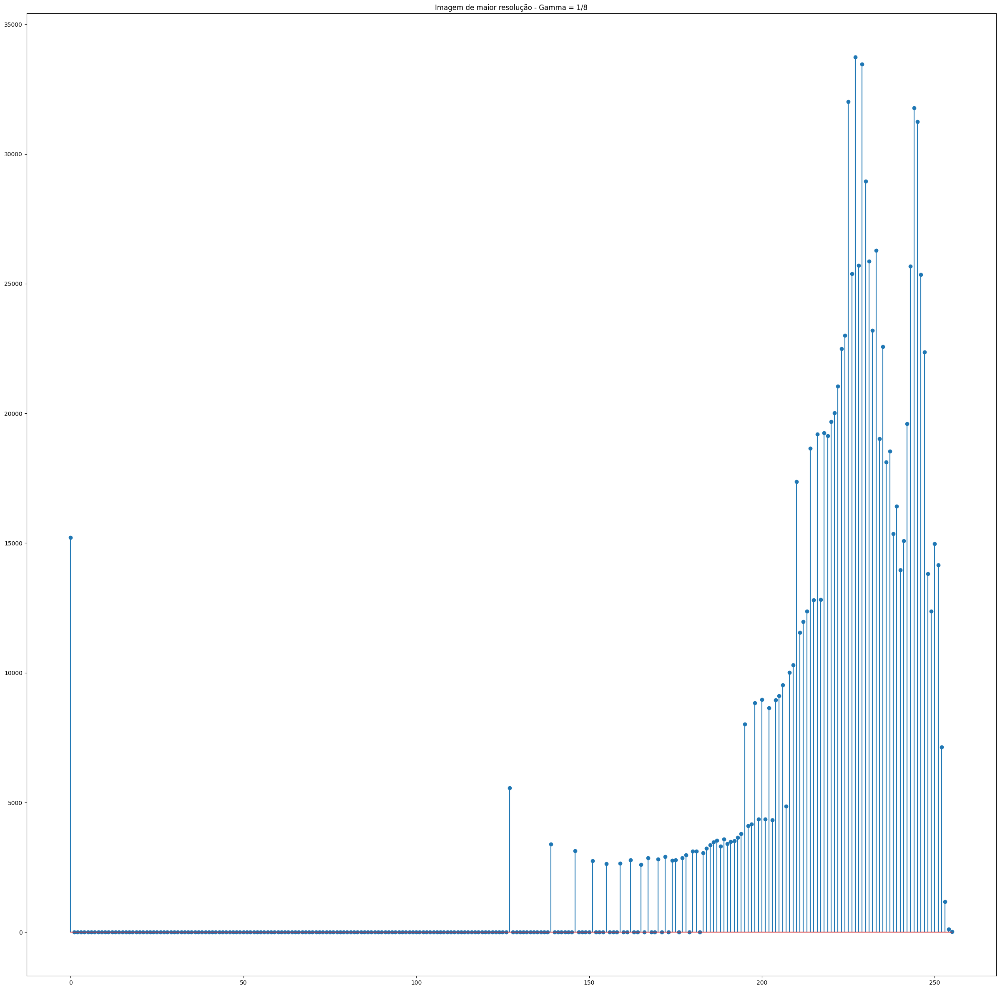

In [ ]:
second_gamma_correction_high_resolution = gammacorrection(gray_garden_high_resolution,(1/8))
#cv2_imshow(second_gamma_correction_high_resolution)
second_gamma_correction_histogram = cv2.calcHist([second_gamma_correction_high_resolution],[0], None, [256], [0, 256])
plt.figure(figsize=(30,30))
plt.title("Imagem de maior resolução - Gamma = 1/8")
plt.stem(second_gamma_correction_histogram)

##Escurecimento da imagem de alta resolução

$Gamma = 2$

<StemContainer object of 3 artists>

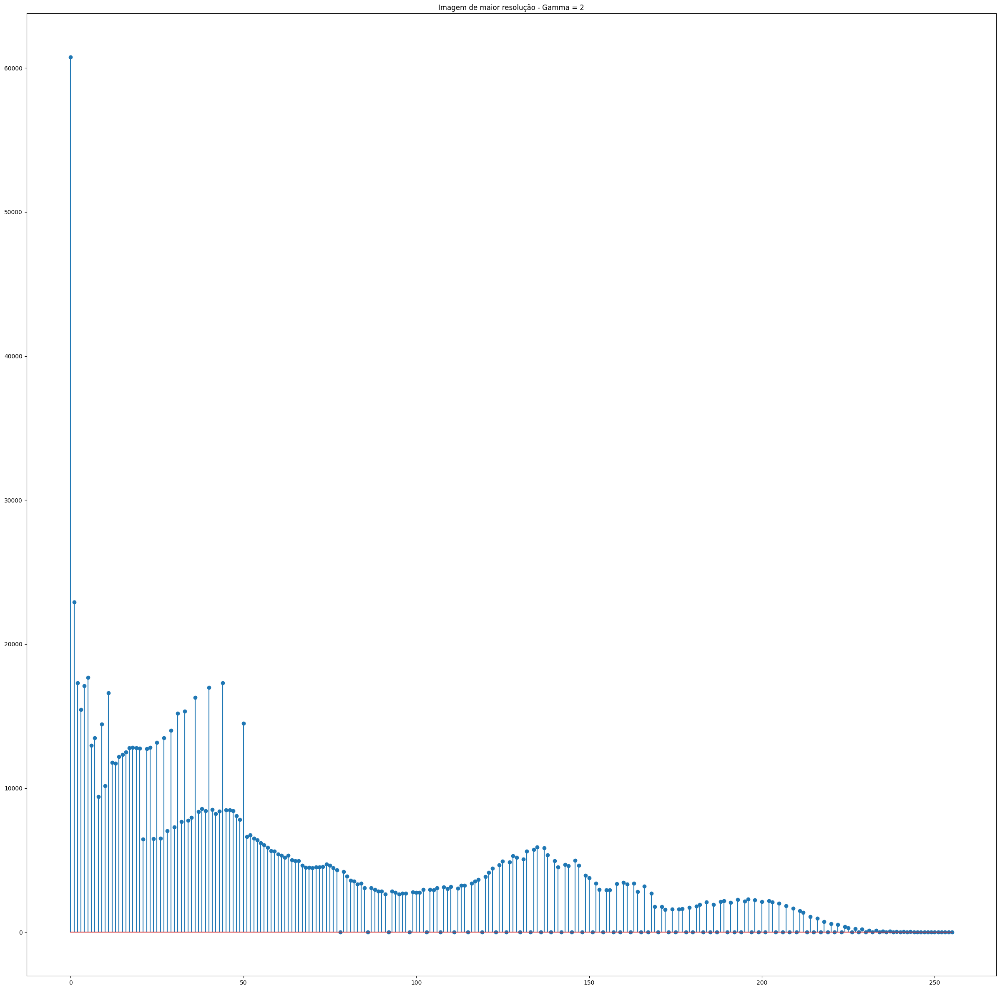

In [ ]:
third_gamma_correction_high_resolution = gammacorrection(gray_garden_high_resolution,2)
#cv2_imshow(third_gamma_correction_high_resolution)
third_gamma_correction_histogram = cv2.calcHist([third_gamma_correction_high_resolution ],[0], None, [256], [0, 256])
plt.figure(figsize=(30,30))
plt.title("Imagem de maior resolução - Gamma = 2")
plt.stem(third_gamma_correction_histogram)

$Gamma = 4$

<StemContainer object of 3 artists>

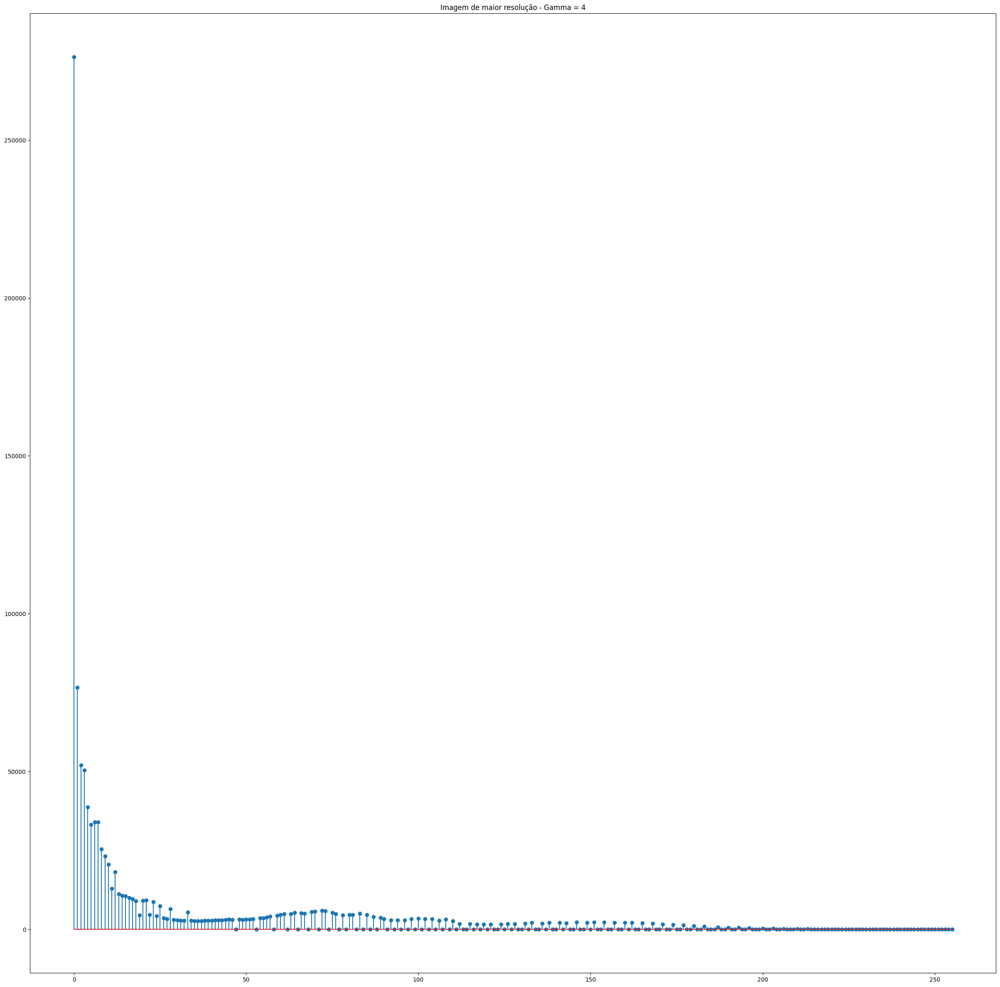

In [ ]:
fourth_gamma_correction_high_resolution = gammacorrection(gray_garden_high_resolution,4)
#cv2_imshow(fourth_gamma_correction_high_resolution)
fourth_gamma_correction_histogram = cv2.calcHist([fourth_gamma_correction_high_resolution],[0], None, [256], [0, 256])
plt.figure(figsize=(30,30))
plt.title("Imagem de maior resolução - Gamma = 4")
plt.stem(fourth_gamma_correction_histogram)

##Clareamento da imagem de baixa resolução

$Gamma = \frac{1}{4}$

<StemContainer object of 3 artists>

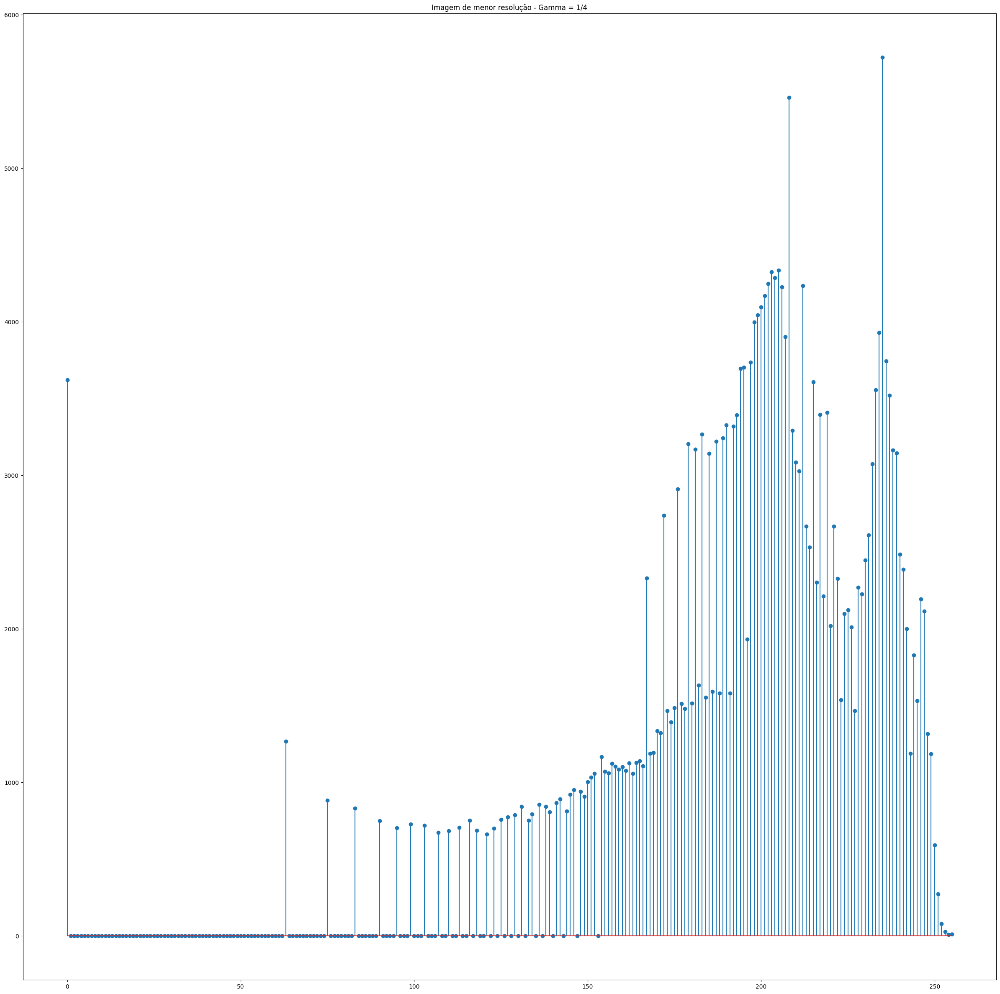

In [ ]:
first_gamma_correction_low_resolution = gammacorrection(gray_garden_low_resolution,(1/4))
#cv2_imshow(first_gamma_correction_low_resolution)
low_first_gamma_correction_histogram = cv2.calcHist([first_gamma_correction_low_resolution],[0], None, [256], [0, 256])
plt.figure(figsize=(30,30))
plt.title("Imagem de menor resolução - Gamma = 1/4")
plt.stem(low_first_gamma_correction_histogram)

$Gamma = \frac{1}{6}$

<StemContainer object of 3 artists>

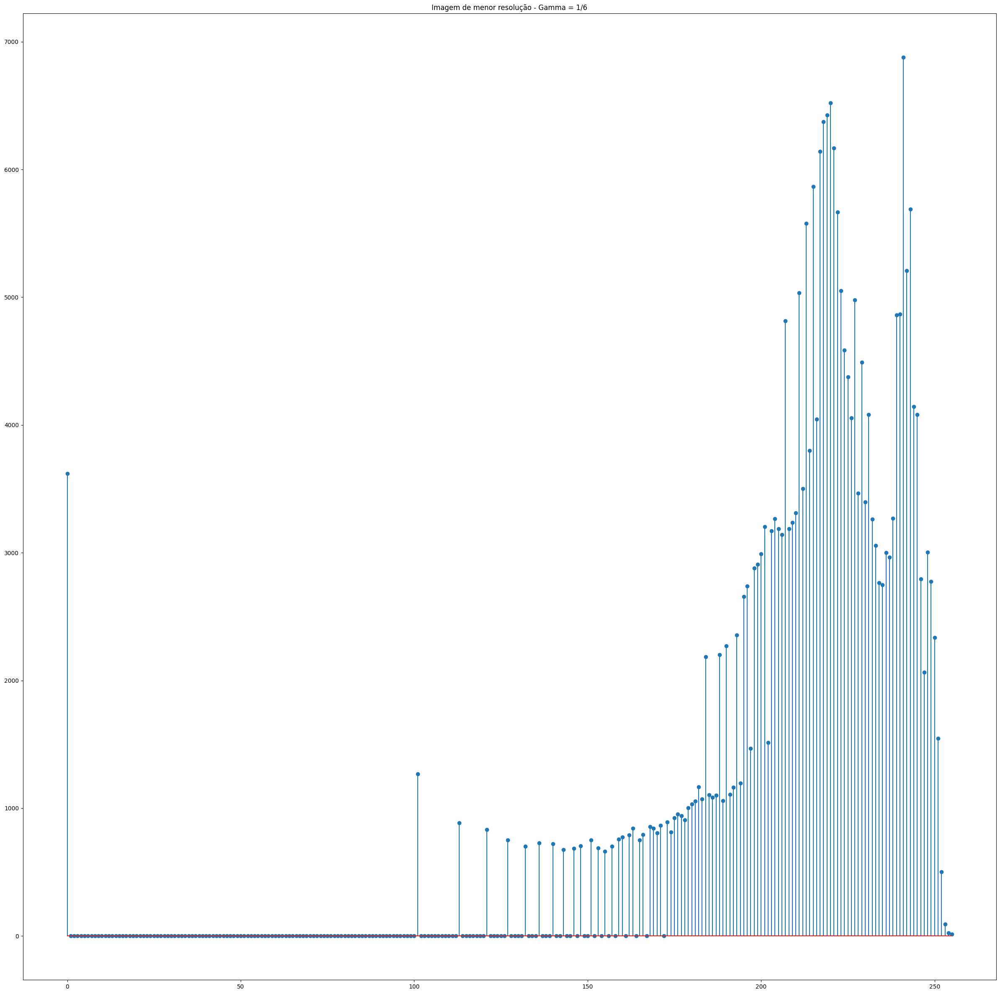

In [ ]:
second_gamma_correction_low_resolution = gammacorrection(gray_garden_low_resolution,(1/6))
#cv2_imshow(second_gamma_correction_low_resolution)
low_second_gamma_correction_histogram = cv2.calcHist([second_gamma_correction_low_resolution],[0], None, [256], [0, 256])
plt.figure(figsize=(30,30))
plt.title("Imagem de menor resolução - Gamma = 1/6")
plt.stem(low_second_gamma_correction_histogram)

##Escurecimento da imagem de baixa resolução

$Gamma = 3$

<StemContainer object of 3 artists>

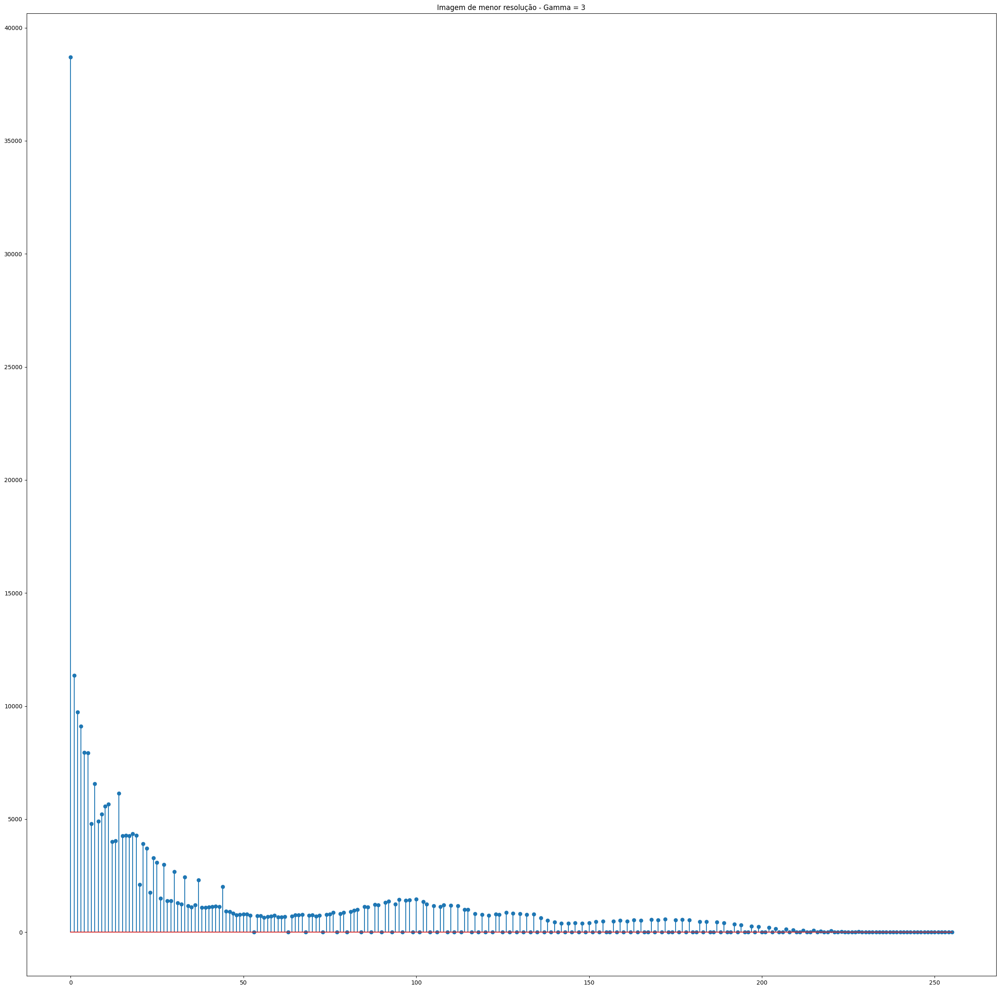

In [ ]:
third_gamma_correction_low_resolution = gammacorrection(gray_garden_low_resolution,3)
#cv2_imshow(third_gamma_correction_low_resolution)
low_third_gamma_correction_histogram = cv2.calcHist([third_gamma_correction_low_resolution],[0], None, [256], [0, 256])
plt.figure(figsize=(30,30))
plt.title("Imagem de menor resolução - Gamma = 3")
plt.stem(low_third_gamma_correction_histogram)

$Gamma = 5$

<StemContainer object of 3 artists>

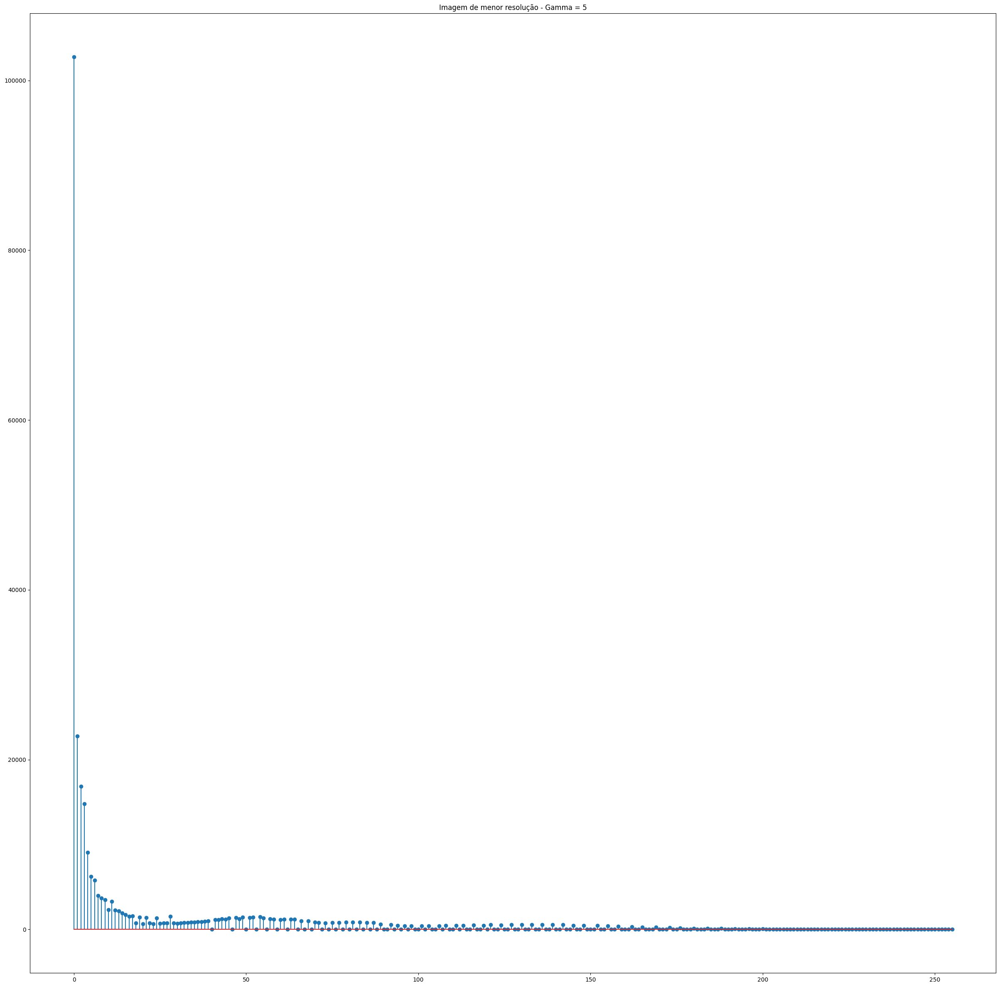

In [ ]:
fourth_gamma_correction_low_resolution = gammacorrection(gray_garden_low_resolution,5)
#cv2_imshow(fourth_gamma_correction_low_resolution)
low_fourth_gamma_correction_histogram = cv2.calcHist([fourth_gamma_correction_low_resolution],[0], None, [256], [0, 256])
plt.figure(figsize=(30,30))
plt.title("Imagem de menor resolução - Gamma = 5")
plt.stem(low_fourth_gamma_correction_histogram)

#Binarização das Imagens

In [ ]:
def show_image(img, title):
    plt.imshow(img, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()

##Imagens de alta resolução

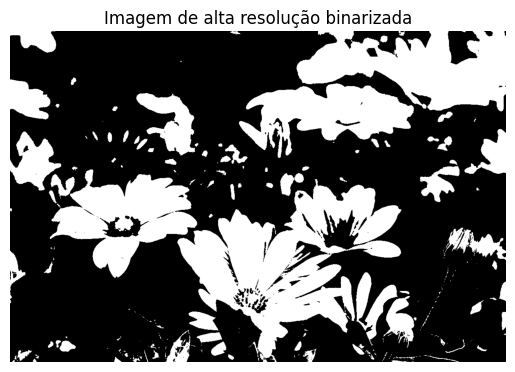

In [ ]:
_, thresh_binary_01 = cv2.threshold(gray_garden_high_resolution, 127, 255, cv2.THRESH_BINARY)
show_image(thresh_binary_01, 'Imagem de alta resolução binarizada')

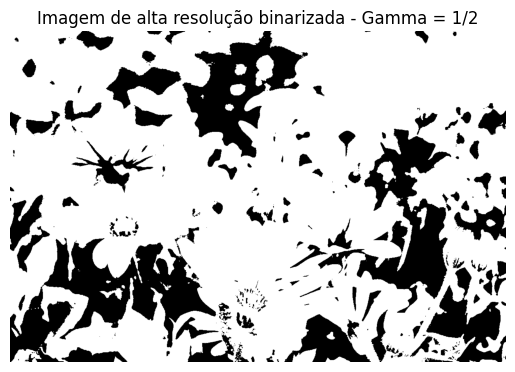

In [ ]:
_, thresh_binary_02 = cv2.threshold(first_gamma_correction_high_resolution, 127, 255, cv2.THRESH_BINARY)
show_image(thresh_binary_02, 'Imagem de alta resolução binarizada - Gamma = 1/2')

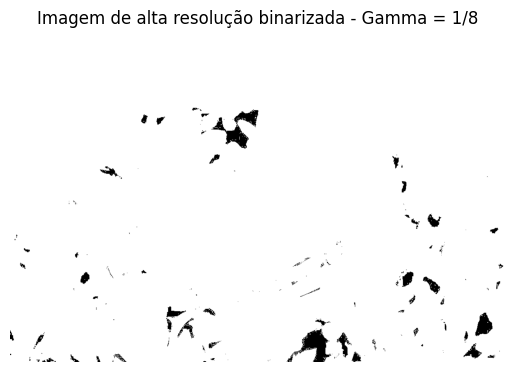

In [ ]:
_, thresh_binary_03 = cv2.threshold(second_gamma_correction_high_resolution, 127, 255, cv2.THRESH_BINARY)
show_image(thresh_binary_03, 'Imagem de alta resolução binarizada - Gamma = 1/8')

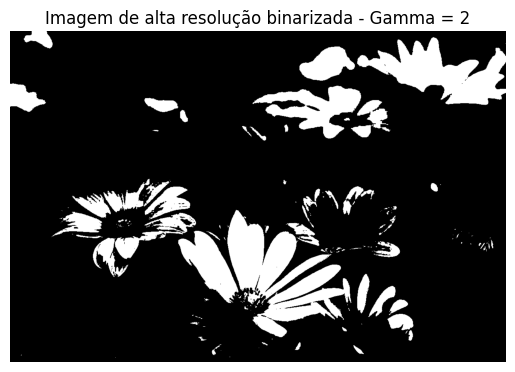

In [ ]:
_, thresh_binary_04 = cv2.threshold(third_gamma_correction_high_resolution, 127, 255, cv2.THRESH_BINARY)
show_image(thresh_binary_04, 'Imagem de alta resolução binarizada - Gamma = 2')

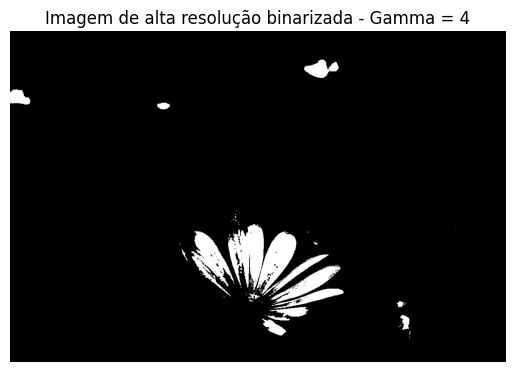

In [ ]:
_, thresh_binary_04 = cv2.threshold(fourth_gamma_correction_high_resolution, 127, 255, cv2.THRESH_BINARY)
show_image(thresh_binary_04, 'Imagem de alta resolução binarizada - Gamma = 4')

##Imagens de baixa resolução

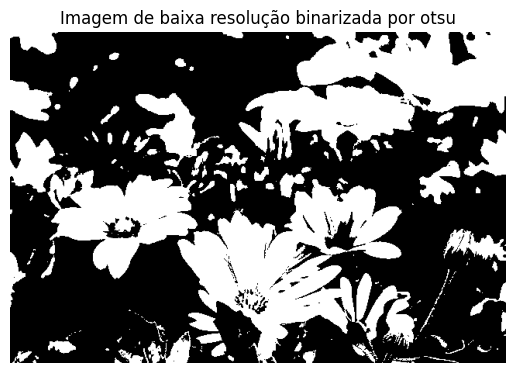

In [ ]:
ret_01, otsu_thresh_01 = cv2.threshold(gray_garden_low_resolution, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
show_image(otsu_thresh_01, 'Imagem de baixa resolução binarizada por otsu')

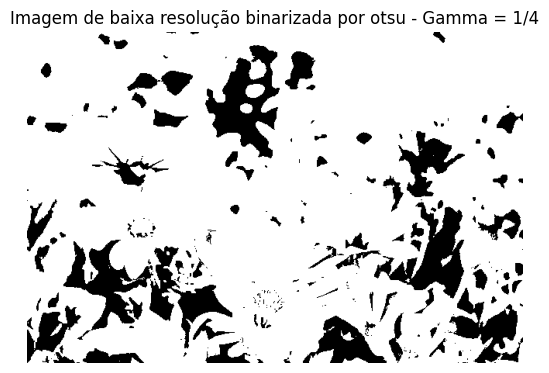

In [ ]:
ret_02, otsu_thresh_02 = cv2.threshold(first_gamma_correction_low_resolution, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
show_image(otsu_thresh_02, 'Imagem de baixa resolução binarizada por otsu - Gamma = 1/4')

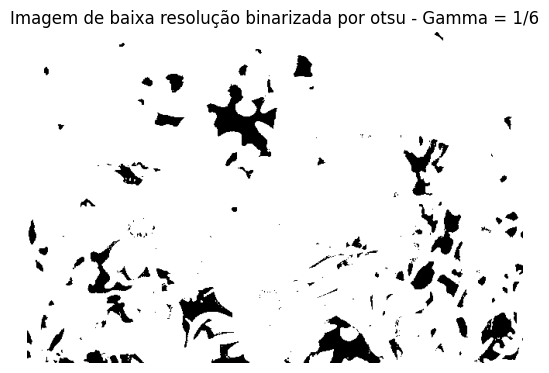

In [ ]:
ret_03, otsu_thresh_03 = cv2.threshold(second_gamma_correction_low_resolution, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
show_image(otsu_thresh_03, 'Imagem de baixa resolução binarizada por otsu - Gamma = 1/6')

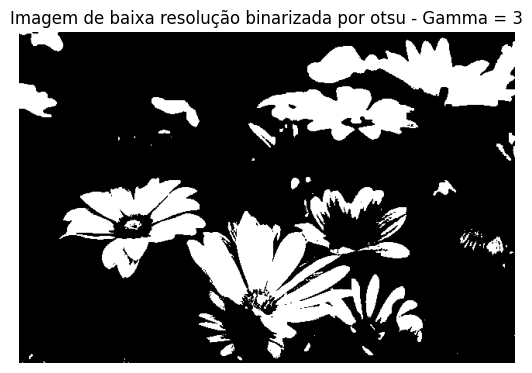

In [ ]:
ret_04, otsu_thresh_04 = cv2.threshold(third_gamma_correction_low_resolution, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
show_image(otsu_thresh_04, 'Imagem de baixa resolução binarizada por otsu - Gamma = 3')

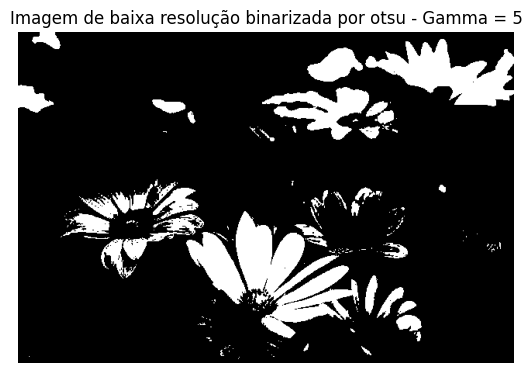

In [ ]:
ret_05, otsu_thresh_05 = cv2.threshold(fourth_gamma_correction_low_resolution, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
show_image(otsu_thresh_05, 'Imagem de baixa resolução binarizada por otsu - Gamma = 5')

#Separação de Bits

In [ ]:
def extract_bit_plane(imagem):
    #  extraindo todos os bits um por um
    # do 1º ao 8º na variável
    # de c1 a c8 respectivamente
    c1 = np.mod(imagem, 2)
    c2 = np.mod(np.floor(imagem/2), 2)
    c3 = np.mod(np.floor(imagem/4), 2)
    c4 = np.mod(np.floor(imagem/8), 2)
    c5 = np.mod(np.floor(imagem/16), 2)
    c6 = np.mod(np.floor(imagem/32), 2)
    c7 = np.mod(np.floor(imagem/64), 2)
    c8 = np.mod(np.floor(imagem/128), 2)
    # combinando a imagem novamente para formar equivalente à imagem original em tons de cinza
    cc = (2 * (2 * (2 * c8 + c7) + c6))*16 # reconstruindo imagem com 3 planos de bits mais significativos
    to_plot = [imagem, c1, c2, c3, c4, c5, c6, c7, c8, cc]
    fig, axes = plt.subplots(nrows=2, ncols=5,figsize=(30, 15), subplot_kw={'xticks': [], 'yticks': []})
    fig.subplots_adjust(hspace=0.05, wspace=0.05)
    for ax, i in zip(axes.flat, to_plot):
        ax.imshow(i, cmap='gray')
    plt.tight_layout()
    plt.show()
    return cc

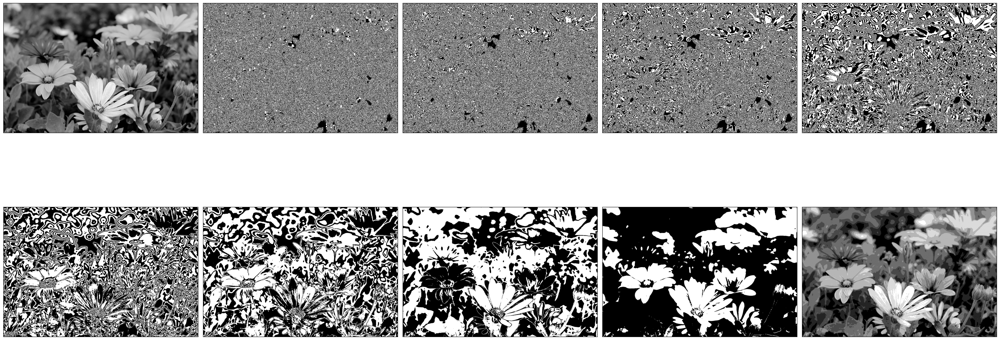

In [ ]:
reconstructed_image_high = extract_bit_plane(gray_garden_high_resolution)

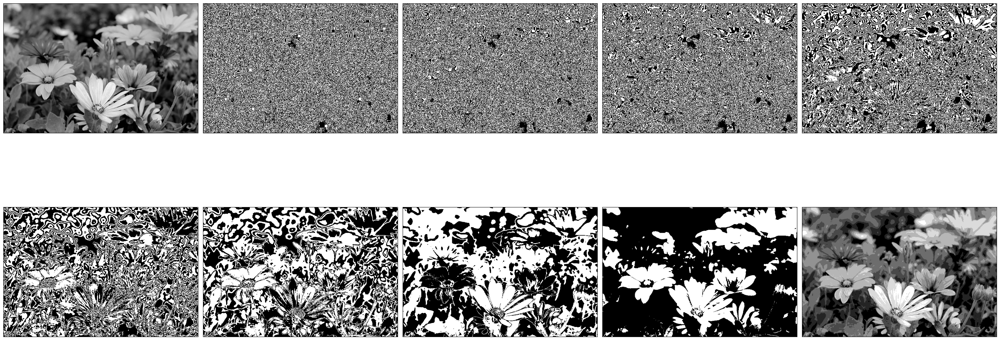

In [ ]:
reconstructed_image_low = extract_bit_plane(gray_garden_low_resolution)

#Substituição de bits menos significativos


In [ ]:
def swap_LSB(imagem,bits):


  c1 = np.mod(imagem, 2)
  c2 = np.mod(np.floor(imagem/2), 2)
  c3 = np.mod(np.floor(imagem/4), 2)
  c4 = np.mod(np.floor(imagem/8), 2)
  c5 = np.mod(np.floor(imagem/16), 2)
  c6 = np.mod(np.floor(imagem/32), 2)
  c7 = np.mod(np.floor(imagem/64), 2)
  c8 = np.mod(np.floor(imagem/128), 2)

  if(bits == 1):

    new_image = (c8*128) + (c7*64) + (c6*32) + (c5*16) + (c4*8) + (c3*4) + (c2*2)

  elif(bits == 2):

    new_image = (c8*128) + (c7*64) + (c6*32) + (c5*16) + (c4*8) + (c3*4)

  elif(bits == 3):

    new_image = (c8*128) + (c7*64) + (c6*32) + (c5*16) + (c4*8)

  elif(bits == 4):

    new_image = (c8*128) + (c7*64) + (c6*32) + (c5*16)

  else:

    return 'digite um número entre 1 e 4 para os bits'

  return new_image.astype(np.uint8)

##Imagem de Maior Resolução

In [ ]:
Remove_01_LSB_High_Resolution = swap_LSB(gray_garden_high_resolution,1)

PSNR_Remove_01_LSB_High_Resolution = cv2.PSNR(gray_garden_high_resolution,Remove_01_LSB_High_Resolution)
print("Taxa de proximidade entre as imagens(PSNR - dB): ", PSNR_Remove_01_LSB_High_Resolution)

SSIM_Remove_01_LSB_High_Resolution = ssim(gray_garden_high_resolution,Remove_01_LSB_High_Resolution)
print("Taxa de proximidade entre as imagens(SSIM - %): ", SSIM_Remove_01_LSB_High_Resolution*100)

Taxa de proximidade entre as imagens(PSNR - dB):  51.185609909789065
Taxa de proximidade entre as imagens(SSIM - %):  99.7485883996573


In [ ]:
Remove_02_LSB_High_Resolution = swap_LSB(gray_garden_high_resolution,2)

PSNR_Remove_02_LSB_High_Resolution = cv2.PSNR(gray_garden_high_resolution,Remove_02_LSB_High_Resolution)
print("Taxa de proximidade entre as imagens(PSNR - dB): ", PSNR_Remove_02_LSB_High_Resolution)

SSIM_Remove_02_LSB_High_Resolution = ssim(gray_garden_high_resolution,Remove_02_LSB_High_Resolution)
print("Taxa de proximidade entre as imagens(SSIM - %): ", SSIM_Remove_02_LSB_High_Resolution*100)

Taxa de proximidade entre as imagens(PSNR - dB):  42.74928655087014
Taxa de proximidade entre as imagens(SSIM - %):  98.76030198777089


In [ ]:
Remove_03_LSB_High_Resolution = swap_LSB(gray_garden_high_resolution,3)

PSNR_Remove_03_LSB_High_Resolution = cv2.PSNR(gray_garden_high_resolution,Remove_03_LSB_High_Resolution)
print("Taxa de proximidade entre as imagens(PSNR - dB): ", PSNR_Remove_03_LSB_High_Resolution)

SSIM_Remove_03_LSB_High_Resolution = ssim(gray_garden_high_resolution,Remove_03_LSB_High_Resolution)
print("Taxa de proximidade entre as imagens(SSIM - %): ", SSIM_Remove_03_LSB_High_Resolution*100)

Taxa de proximidade entre as imagens(PSNR - dB):  35.797914926298034
Taxa de proximidade entre as imagens(SSIM - %):  95.31453882205231


In [ ]:
Remove_04_LSB_High_Resolution = swap_LSB(gray_garden_high_resolution,4)

PSNR_Remove_04_LSB_High_Resolution = cv2.PSNR(gray_garden_high_resolution,Remove_04_LSB_High_Resolution)
print("Taxa de proximidade entre as imagens(PSNR - dB): ", PSNR_Remove_04_LSB_High_Resolution)

SSIM_Remove_04_LSB_High_Resolution = ssim(gray_garden_high_resolution,Remove_04_LSB_High_Resolution)
print("Taxa de proximidade entre as imagens(SSIM - %): ", SSIM_Remove_04_LSB_High_Resolution*100)

Taxa de proximidade entre as imagens(PSNR - dB):  29.326070632364726
Taxa de proximidade entre as imagens(SSIM - %):  86.3349193981083


##Imagem de Menor Resolução

In [ ]:
Remove_01_LSB_Low_Resolution = swap_LSB(gray_garden_low_resolution,1)

PSNR_Remove_01_LSB_Low_Resolution = cv2.PSNR(gray_garden_low_resolution,Remove_01_LSB_Low_Resolution)
print("Taxa de proximidade entre as imagens(PSNR - dB): ", PSNR_Remove_01_LSB_Low_Resolution)

SSIM_Remove_01_LSB_Low_Resolution = ssim(gray_garden_low_resolution,Remove_01_LSB_Low_Resolution)
print("Taxa de proximidade entre as imagens(SSIM - %): ", SSIM_Remove_01_LSB_Low_Resolution*100)

Taxa de proximidade entre as imagens(PSNR - dB):  51.19360875421799
Taxa de proximidade entre as imagens(SSIM - %):  99.84786275744715


In [ ]:
Remove_02_LSB_Low_Resolution = swap_LSB(gray_garden_low_resolution,2)

PSNR_Remove_02_LSB_Low_Resolution = cv2.PSNR(gray_garden_low_resolution,Remove_02_LSB_Low_Resolution)
print("Taxa de proximidade entre as imagens(PSNR - dB): ", PSNR_Remove_02_LSB_Low_Resolution)

SSIM_Remove_02_LSB_Low_Resolution = ssim(gray_garden_low_resolution,Remove_02_LSB_Low_Resolution)
print("Taxa de proximidade entre as imagens(SSIM - %): ", SSIM_Remove_02_LSB_Low_Resolution*100)

Taxa de proximidade entre as imagens(PSNR - dB):  42.756548267476255
Taxa de proximidade entre as imagens(SSIM - %):  99.22997589072038


In [ ]:
Remove_03_LSB_Low_Resolution = swap_LSB(gray_garden_low_resolution,3)

PSNR_Remove_03_LSB_Low_Resolution = cv2.PSNR(gray_garden_low_resolution,Remove_03_LSB_Low_Resolution)
print("Taxa de proximidade entre as imagens(PSNR - dB): ", PSNR_Remove_03_LSB_Low_Resolution)

SSIM_Remove_03_LSB_Low_Resolution = ssim(gray_garden_low_resolution,Remove_03_LSB_Low_Resolution)
print("Taxa de proximidade entre as imagens(SSIM - %): ", SSIM_Remove_03_LSB_Low_Resolution*100)

Taxa de proximidade entre as imagens(PSNR - dB):  35.79402826668189
Taxa de proximidade entre as imagens(SSIM - %):  96.93681306023247


In [ ]:
Remove_04_LSB_Low_Resolution = swap_LSB(gray_garden_low_resolution,4)

PSNR_Remove_04_LSB_Low_Resolution = cv2.PSNR(gray_garden_low_resolution,Remove_04_LSB_Low_Resolution)
print("Taxa de proximidade entre as imagens(PSNR - dB): ", PSNR_Remove_04_LSB_Low_Resolution)

SSIM_Remove_04_LSB_Low_Resolution = ssim(gray_garden_low_resolution,Remove_04_LSB_Low_Resolution)
print("Taxa de proximidade entre as imagens(SSIM - %): ", SSIM_Remove_04_LSB_Low_Resolution*100)

Taxa de proximidade entre as imagens(PSNR - dB):  29.32877908270553
Taxa de proximidade entre as imagens(SSIM - %):  89.87665150755416
